# 데이터 셋 다운로드 

In [22]:
# Clone the entire repo.
# !git clone https://github.com/tensorflow/tcav.git tcav
%cd tcav
!ls

/home/js/Desktop/xai-main/tcav/tcav
activation_generator.py  mobilenet_v2_1.0_224  tcav_examples  utils.py
cav.py			 model.py	       tcav.py	      utils_test.py
cav_test.py		 model_test.py	       tcav_results
inception5h		 __pycache__	       tcav_test.py
__init__.py		 run_params.py	       utils_plot.py


In [23]:
import os 
os.getcwd()

'/home/js/Desktop/xai-main/tcav/tcav'

In [24]:
# 경로 설정 변경  cd /Downloads/...
# %cd /home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet
# %run download_and_make_datasets.py --source_dir=data --number_of_images_per_folder=10 --number_of_random_folders=10

## AutoReload 외부 모듈 수정사항

In [26]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Tcav library

In [32]:
import os 
os.getcwd()

#tcav 파일 이동 
set_getcwd = '/home/js/Desktop/xai-main'
os.chdir(set_getcwd+'/tcav')


In [33]:
import os
os.getcwd()

'/home/js/Desktop/xai-main/tcav'

In [18]:
import tcav.activation_generator as act_gen
import tcav.cav as cav
import tcav.model  as model
import tcav.tcav as tcav
import tcav.utils as utils
import tcav.utils_plot as utils_plot # utils_plot requires matplotlib
import os 
import tensorflow as tf

In [19]:
# This is the name of your model wrapper (InceptionV3 and GoogleNet are provided in model.py)
model_to_run = 'GoogleNet'
# the name of the parent directory that results are stored (only if you want to cache)
project_name = 'tcav_class_test'
working_dir = '/home/js/Downloads/tcav'
# where activations are stored (only if your act_gen_wrapper does so)
activation_dir =  working_dir+ '/activations/'
# where CAVs are stored. 
# You can say None if you don't wish to store any.
cav_dir = working_dir + '/cavs/'
# where the images live. 
source_dir = '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data'
bottlenecks = [ 'mixed4c']  # @param 
      
utils.make_dir_if_not_exists(activation_dir)
utils.make_dir_if_not_exists(working_dir)
utils.make_dir_if_not_exists(cav_dir)

# this is a regularizer penalty parameter for linear classifier to get CAVs. 
alphas = [0.1]   

target = 'zebra'  
concepts = ["dotted","striped","zigzagged"]   

In [20]:
%cp -av '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data/mobilenet_v2_1.0_224' '/home/js/Downloads/tcav/tcav/mobilenet_v2_1.0_224'
%rm '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data/mobilenet_v2_1.0_224'

cp: cannot stat '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data/mobilenet_v2_1.0_224': No such file or directory
rm: cannot remove '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data/mobilenet_v2_1.0_224': No such file or directory


In [21]:
%cp -av '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data/inception5h' '/home/js/Downloads/tcav/tcav/inception5h'
%rm '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data/inception5h'

cp: cannot stat '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data/inception5h': No such file or directory
rm: cannot remove '/home/js/Downloads/tcav/tcav/tcav_examples/image_models/imagenet/data/inception5h': No such file or directory


In [22]:
sess = utils.create_session()

# GRAPH_PATH is where the trained model is stored.
GRAPH_PATH = "/home/js/Downloads/tcav/tcav/inception5h/tensorflow_inception_graph.pb"
# LABEL_PATH is where the labels are stored. Each line contains one class, and they are ordered with respect to their index in 
# the logit layer. (yes, id_to_label function in the model wrapper reads from this file.)
# For example, imagenet_comp_graph_label_strings.txt looks like:
# dummy                                                                                      
# kit fox
# English setter
# Siberian husky ...

LABEL_PATH = "/home/js/Downloads/tcav/tcav/inception5h/imagenet_comp_graph_label_strings.txt"

mymodel = model.GoogleNetWrapper_public(sess,
                                        GRAPH_PATH,
                                        LABEL_PATH)

2022-12-01 03:57:54.768079: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-01 03:57:54.800445: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:267] failed call to cuInit: CUDA_ERROR_SYSTEM_DRIVER_MISMATCH: system has unsupported display driver / cuda driver combination
2022-12-01 03:57:54.800472: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:169] retrieving CUDA diagnostic information for host: js-0911
2022-12-01 03:57:54.800482: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:176] hostname: js-0911
2022-12-01 03:57:54.800609: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:200] libcuda reported version is: 510.85.2
2022-12-01 03:57:54.800636: 

NotFoundError: /home/js/Downloads/tcav/tcav/inception5h/imagenet_comp_graph_label_strings.txt; No such file or directory

In [20]:
act_generator = act_gen.ImageActivationGenerator(mymodel, source_dir, activation_dir, max_examples=100)

---

## TCAV -ResNet50

In [21]:
! pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 10.8 MB/s eta 0:00:0031m11.7 MB/s eta 0:00:01


In [34]:
import numpy as np
import os, glob

import matplotlib.pyplot as plt

from PIL import Image

from scipy.stats import ttest_ind

# ..........torch imports............
import torch
import torchvision

from torch.utils.data import IterableDataset, DataLoader
from torchvision import transforms

#.... Captum imports..................
from captum.attr import LayerGradientXActivation, LayerIntegratedGradients

from captum.concept import TCAV
from captum.concept import Concept

from captum.concept._utils.data_iterator import dataset_to_dataloader, CustomIterableDataset
from captum.concept._utils.common import concepts_to_str

In [35]:
# Method to normalize an image to Imagenet mean and standard deviation
def transform(img):

    return transforms.Compose(
        [
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(
                mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
            ),
        ]
    )(img)

In [51]:
import os 
os.chdir('/home/js/Desktop/xai-main')
os.getcwd()

'/home/js/Desktop/xai-main'

In [52]:
import os 
#tcav 파일 이동
set_getcwd =os.getcwd()
os.chdir(set_getcwd+'/tcav')


In [53]:
def get_tensor_from_filename(filename):
    img = Image.open(filename).convert("RGB")
    return transform(img)


def load_image_tensors(class_name, root_path= set_getcwd + '/tcav/tcav_examples/image_models/imagenet/data/', transform=True):
    path = os.path.join(root_path, class_name)
    filenames = glob.glob(path + '/*.jpg')

    tensors = []
    for filename in filenames:
        img = Image.open(filename).convert('RGB')
        tensors.append(transform(img) if transform else img)
    
    return tensors

In [54]:
def assemble_concept(name, id, concepts_path= set_getcwd +"/tcav/tcav_examples/image_models/imagenet/data/"):
    concept_path = os.path.join(concepts_path, name) + "/"
    dataset = CustomIterableDataset(get_tensor_from_filename, concept_path)
    concept_iter = dataset_to_dataloader(dataset)

    return Concept(id=id, name=name, data_iter=concept_iter)

In [58]:
concepts_path = set_getcwd+"/tcav/tcav/tcav_examples/image_models/imagenet/data/"

stripes_concept = assemble_concept("striped", 0, concepts_path=concepts_path)
zigzagged_concept = assemble_concept("zigzagged", 1, concepts_path=concepts_path)
dotted_concept = assemble_concept("dotted", 2, concepts_path=concepts_path)


random_0_concept = assemble_concept("random500_0", 3, concepts_path=concepts_path)
random_1_concept = assemble_concept("random500_1", 4, concepts_path=concepts_path)

In [59]:
concepts_path

'/home/js/Desktop/xai-main/tcav/tcav/tcav_examples/image_models/imagenet/data/'

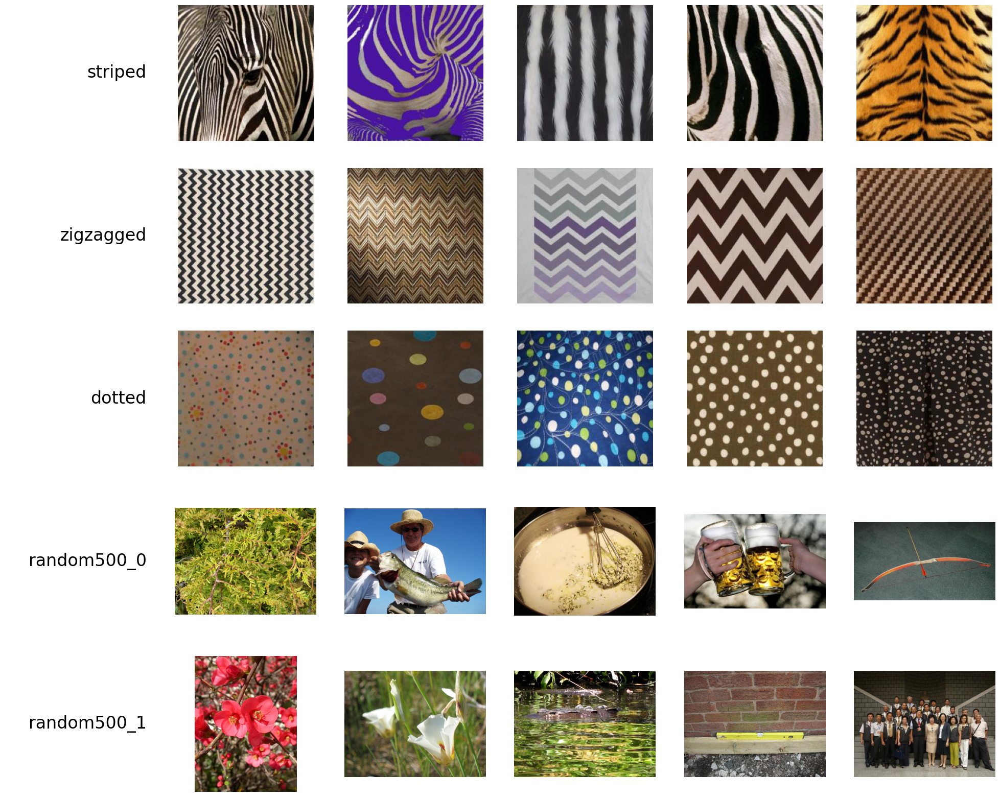

In [60]:
n_figs = 5
n_concepts = 5

fig, axs = plt.subplots(n_concepts, n_figs + 1, figsize = (25, 4 * n_concepts))

for c, concept in enumerate([stripes_concept, zigzagged_concept, dotted_concept, random_0_concept, random_1_concept]):
    concept_path = os.path.join(concepts_path, concept.name) + "/"
    img_files = glob.glob(concept_path + '*')
    for i, img_file in enumerate(img_files[:n_figs + 1]):
        if os.path.isfile(img_file):
            if i == 0:
                axs[c, i].text(1.0, 0.5, str(concept.name), ha='right', va='center', family='sans-serif', size=24)
            else:
                img = plt.imread(img_file)
                axs[c, i].imshow(img)

            axs[c, i].axis('off')

## Resnet50

In [369]:
model = torchvision.models.resnet50(pretrained=True)
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [61]:
layers=['layer2', 'layer3', 'layer4']

mytcav = TCAV(model=model,
              layers=layers,
              layer_attr_method = LayerIntegratedGradients(
                model, None, multiply_by_inputs=False))

/home/js/anaconda3/lib/python3.9/site-packages/captum/concept/_utils/classifier.py:130: UserWarning: Using default classifier for TCAV which keeps input both train and test datasets in the memory. Consider defining your own classifier that doesn't rely heavily on memory, for large number of concepts, by extending `Classifer` abstract class
  warnings.warn(


In [62]:
experimental_set_rand = [[stripes_concept, random_0_concept], [stripes_concept, random_1_concept]]

In [63]:
# Load sample images from folder
zebra_imgs = load_image_tensors(set_getcwd+'/tcav/tcav_examples/image_models/imagenet/data/zebra', transform=False)

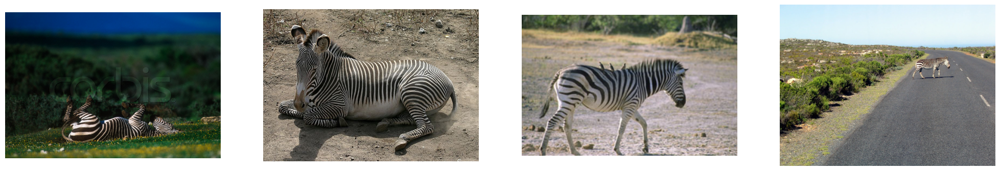

In [64]:
fig, axs = plt.subplots(1, 4, figsize = (25, 5))
axs[0].imshow(zebra_imgs[0])
axs[1].imshow(zebra_imgs[1])
axs[2].imshow(zebra_imgs[2])
axs[3].imshow(zebra_imgs[3])
# axs[4].imshow(zebra_imgs[4]])

axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
axs[3].axis('off')
# axs[4].axis('off')

plt.show()

In [65]:
# Load sample images from folder
zebra_tensors = torch.stack([transform(img) for img in zebra_imgs])
experimental_set_rand

[[Concept(0, 'striped'), Concept(3, 'random500_0')],
 [Concept(0, 'striped'), Concept(4, 'random500_1')]]

In [66]:
# zebra class index
zebra_ind = 340


tcav_scores_w_random = mytcav.interpret(inputs=zebra_tensors,
                                        experimental_sets=experimental_set_rand,
                                        target=zebra_ind,
                                        n_steps=5,
                                       )
tcav_scores_w_random

/home/js/anaconda3/lib/python3.9/site-packages/captum/_utils/models/linear_model/train.py:351: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:210.)
  bias_values = torch.FloatTensor([sklearn_model.intercept_]).to(  # type: ignore
/home/js/anaconda3/lib/python3.9/site-packages/torch/autograd/__init__.py:275: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 803: system has unsupported display driver / cuda driver combination (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


defaultdict(<function captum.concept._core.tcav.TCAV.interpret.<locals>.<lambda>()>,
            {'0-3': defaultdict(None,
                         {'layer2': {'sign_count': tensor([0.5000, 0.5000]),
                           'magnitude': tensor([-0.1823,  0.1823])},
                          'layer3': {'sign_count': tensor([0.4000, 0.6000]),
                           'magnitude': tensor([-0.1702,  0.1702])},
                          'layer4': {'sign_count': tensor([1., 0.]),
                           'magnitude': tensor([ 3.4402, -3.4402])}}),
             '0-4': defaultdict(None,
                         {'layer2': {'sign_count': tensor([0.5000, 0.5000]),
                           'magnitude': tensor([-0.1282,  0.1282])},
                          'layer3': {'sign_count': tensor([0.3000, 0.7000]),
                           'magnitude': tensor([-0.3240,  0.3240])},
                          'layer4': {'sign_count': tensor([0., 1.]),
                           'magnitude': tensor

In [67]:
def format_float(f):
    return float('{:.3f}'.format(f) if abs(f) >= 0.0005 else '{:.3e}'.format(f))

def plot_tcav_scores(experimental_sets, tcav_scores):
    fig, ax = plt.subplots(1, len(experimental_sets), figsize = (25, 7))

    barWidth = 1 / (len(experimental_sets[0]) + 1)

    for idx_es, concepts in enumerate(experimental_sets):

        concepts = experimental_sets[idx_es]
        concepts_key = concepts_to_str(concepts)

        pos = [np.arange(len(layers))]
        for i in range(1, len(concepts)):
            pos.append([(x + barWidth) for x in pos[i-1]])
        _ax = (ax[idx_es] if len(experimental_sets) > 1 else ax)
        for i in range(len(concepts)):
            val = [format_float(scores['sign_count'][i]) for layer, scores in tcav_scores[concepts_key].items()]
            _ax.bar(pos[i], val, width=barWidth, edgecolor='white', label=concepts[i].name)

        # Add xticks on the middle of the group bars
        _ax.set_xlabel('Set {}'.format(str(idx_es)), fontweight='bold', fontsize=16)
        _ax.set_xticks([r + 0.3 * barWidth for r in range(len(layers))])
        _ax.set_xticklabels(layers, fontsize=16)

        # Create legend & Show graphic
        _ax.legend(fontsize=16)

    plt.show()

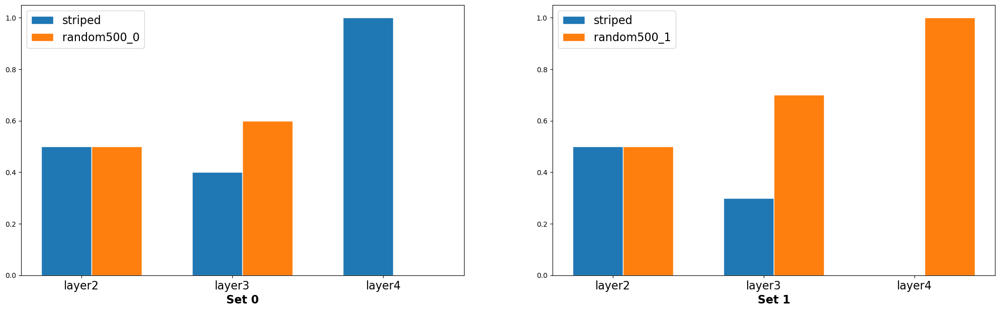

In [68]:
plot_tcav_scores(experimental_set_rand, tcav_scores_w_random)

In [69]:
experimental_set_zig_dot = [[stripes_concept, zigzagged_concept, dotted_concept]]

In [70]:
tcav_scores_w_zig_dot = mytcav.interpret(inputs=zebra_tensors,
                                         experimental_sets=experimental_set_zig_dot,
                                         target=zebra_ind,
                                         n_steps=5)

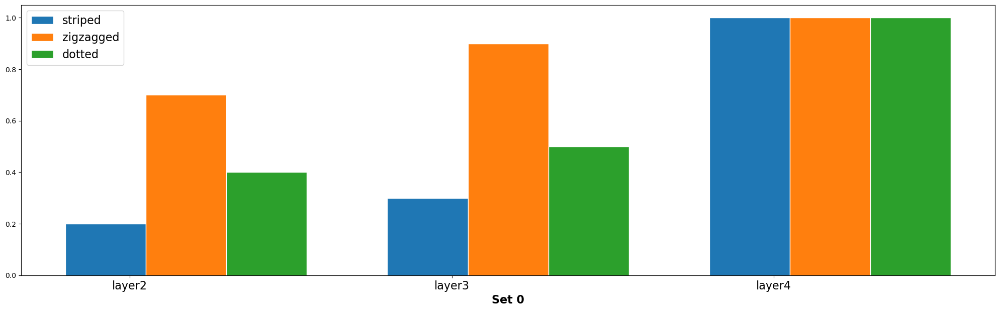

In [71]:
plot_tcav_scores(experimental_set_zig_dot, tcav_scores_w_zig_dot)   

In [72]:
n = 9

random_concepts = [assemble_concept('random' +str('500_')+ str(i+2), i+5) for i in range(0, n)]

print(random_concepts)

experimental_sets = [[stripes_concept, random_0_concept], [stripes_concept, random_1_concept]]
experimental_sets.extend([[stripes_concept, random_concept] for random_concept in random_concepts])

experimental_sets.append([random_0_concept, random_1_concept])
experimental_sets.extend([[random_0_concept, random_concept] for random_concept in random_concepts])

experimental_sets

[Concept(5, 'random500_2'), Concept(6, 'random500_3'), Concept(7, 'random500_4'), Concept(8, 'random500_5'), Concept(9, 'random500_6'), Concept(10, 'random500_7'), Concept(11, 'random500_8'), Concept(12, 'random500_9'), Concept(13, 'random500_10')]


[[Concept(0, 'striped'), Concept(3, 'random500_0')],
 [Concept(0, 'striped'), Concept(4, 'random500_1')],
 [Concept(0, 'striped'), Concept(5, 'random500_2')],
 [Concept(0, 'striped'), Concept(6, 'random500_3')],
 [Concept(0, 'striped'), Concept(7, 'random500_4')],
 [Concept(0, 'striped'), Concept(8, 'random500_5')],
 [Concept(0, 'striped'), Concept(9, 'random500_6')],
 [Concept(0, 'striped'), Concept(10, 'random500_7')],
 [Concept(0, 'striped'), Concept(11, 'random500_8')],
 [Concept(0, 'striped'), Concept(12, 'random500_9')],
 [Concept(0, 'striped'), Concept(13, 'random500_10')],
 [Concept(3, 'random500_0'), Concept(4, 'random500_1')],
 [Concept(3, 'random500_0'), Concept(5, 'random500_2')],
 [Concept(3, 'random500_0'), Concept(6, 'random500_3')],
 [Concept(3, 'random500_0'), Concept(7, 'random500_4')],
 [Concept(3, 'random500_0'), Concept(8, 'random500_5')],
 [Concept(3, 'random500_0'), Concept(9, 'random500_6')],
 [Concept(3, 'random500_0'), Concept(10, 'random500_7')],
 [Concept(3,

In [73]:
def assemble_scores(scores, experimental_sets, idx, score_layer, score_type):
    score_list = []
    for concepts in experimental_sets:
        score_list.append(scores["-".join([str(c.id) for c in concepts])][score_layer][score_type][idx])
        
    return score_list

In [74]:
def get_pval(scores, experimental_sets, score_layer, score_type, alpha=0.05, print_ret=False):
    
    P1 = assemble_scores(scores, experimental_sets, 0, score_layer, score_type)
    P2 = assemble_scores(scores, experimental_sets, 1, score_layer, score_type)
    print(P1),print(P2)
    if print_ret:
        print('P1[mean, std]: ', format_float(np.mean(P1)), format_float(np.std(P1)))
        print('P2[mean, std]: ', format_float(np.mean(P2)), format_float(np.std(P2)))

    _, pval = ttest_ind(P1, P2)

    if print_ret:
        print("p-values:", format_float(pval))

    if pval < alpha:    # alpha value is 0.05 or 5%
        relation = "Disjoint"
        if print_ret:
            print("Disjoint")
    else:
        relation = "Overlap"
        if print_ret:
            print("Overlap")
        
    return P1, P2, format_float(pval), relation

In [75]:
# Run TCAV
scores = mytcav.interpret(zebra_tensors, experimental_sets, zebra_ind, n_steps=5)

In [76]:
n = 4
def show_boxplots(layer, metric='sign_count'):

    def format_label_text(experimental_sets):
        concept_id_list = [exp.name if i == 0 else \
                             exp.name.split('_')[0] for i, exp in enumerate(experimental_sets[0])]
        return concept_id_list

    n_plots = 2

    fig, ax = plt.subplots(1, n_plots, figsize = (25, 7 * 1))
    fs = 18
    for i in range(n_plots):
        esl = experimental_sets[i * n : (i+1) * n]
        P1, P2, pval, relation = get_pval(scores, esl, layer, metric)
        print(P1,P2)
        ax[i].set_ylim([-0.5, 1.5])
        ax[i].set_title(layer + "-" + metric + " (pval=" + str(pval) + " - " + relation + ")", fontsize=fs)
        ax[i].boxplot([P1, P2], showfliers=True)

        ax[i].set_xticklabels(format_label_text(esl), fontsize=fs)

    plt.show()

[tensor(0.5000), tensor(0.5000), tensor(0.6000), tensor(0.3000)]
[tensor(0.5000), tensor(0.5000), tensor(0.4000), tensor(0.7000)]
[tensor(0.5000), tensor(0.5000), tensor(0.6000), tensor(0.3000)] [tensor(0.5000), tensor(0.5000), tensor(0.4000), tensor(0.7000)]
[tensor(0.4000), tensor(0.2000), tensor(0.4000), tensor(0.1000)]
[tensor(0.6000), tensor(0.8000), tensor(0.6000), tensor(0.9000)]
[tensor(0.4000), tensor(0.2000), tensor(0.4000), tensor(0.1000)] [tensor(0.6000), tensor(0.8000), tensor(0.6000), tensor(0.9000)]


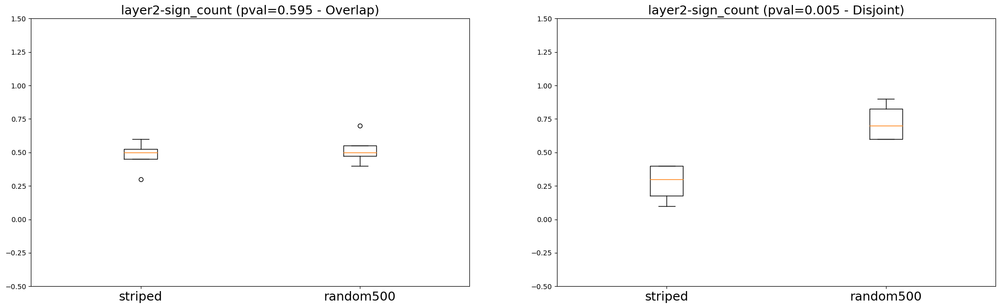

In [77]:
show_boxplots ("layer2")

[tensor(0.4000), tensor(0.3000), tensor(0.5000), tensor(0.5000)]
[tensor(0.6000), tensor(0.7000), tensor(0.5000), tensor(0.5000)]
[tensor(0.4000), tensor(0.3000), tensor(0.5000), tensor(0.5000)] [tensor(0.6000), tensor(0.7000), tensor(0.5000), tensor(0.5000)]
[tensor(0.6000), tensor(0.4000), tensor(0.6000), tensor(0.5000)]
[tensor(0.4000), tensor(0.6000), tensor(0.4000), tensor(0.5000)]
[tensor(0.6000), tensor(0.4000), tensor(0.6000), tensor(0.5000)] [tensor(0.4000), tensor(0.6000), tensor(0.4000), tensor(0.5000)]


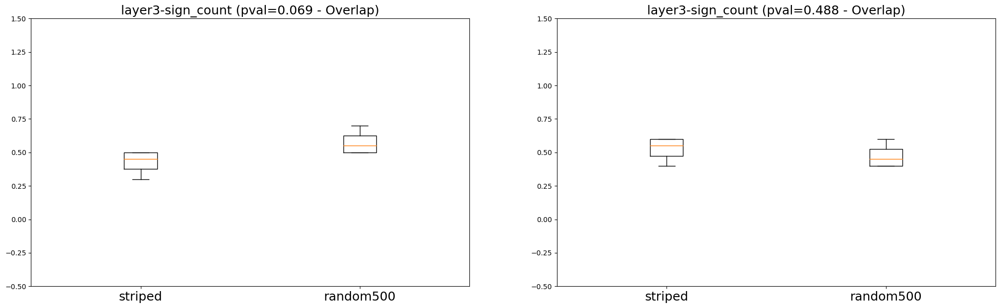

In [78]:
show_boxplots ("layer3")

[tensor(1.), tensor(0.), tensor(1.), tensor(1.)]
[tensor(0.), tensor(1.), tensor(0.), tensor(0.)]
[tensor(1.), tensor(0.), tensor(1.), tensor(1.)] [tensor(0.), tensor(1.), tensor(0.), tensor(0.)]
[tensor(0.), tensor(0.), tensor(1.), tensor(1.)]
[tensor(1.), tensor(1.), tensor(0.), tensor(0.)]
[tensor(0.), tensor(0.), tensor(1.), tensor(1.)] [tensor(1.), tensor(1.), tensor(0.), tensor(0.)]


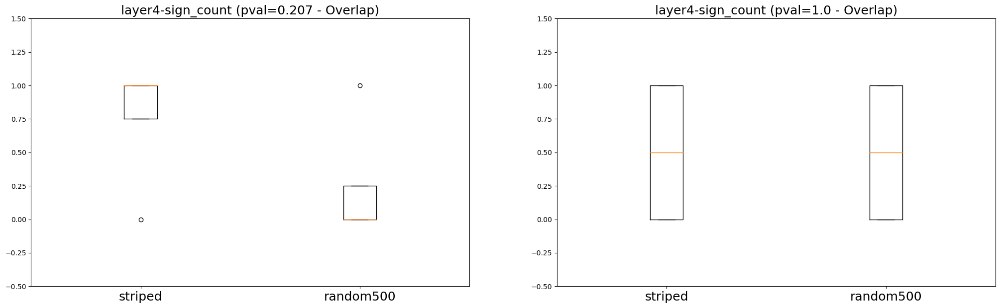

In [79]:
show_boxplots ("layer4")

## VisionTransfomer

In [373]:
model2 = torchvision.models.vit_b_16(pretrained=True)

In [376]:
layers=['encoder.layers.encoder_layer_0', 'encoder.layers.encoder_layer_1', 'encoder.layers.encoder_layer_2']

mytcav = TCAV(model=model2,
              layers=layers,
              layer_attr_method = LayerIntegratedGradients(
                model2, None, multiply_by_inputs=False))

In [377]:
experimental_set_rand = [[stripes_concept, random_0_concept], [stripes_concept, random_1_concept]]

In [378]:
# Load sample images from folder
zebra_imgs = load_image_tensors(set_getcwd+'/tcav/tcav_examples/image_models/imagenet/data/zebra', transform=False)

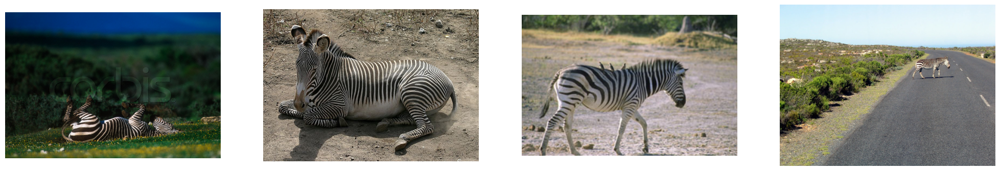

In [379]:
fig, axs = plt.subplots(1, 4, figsize = (25, 5))
axs[0].imshow(zebra_imgs[0])
axs[1].imshow(zebra_imgs[1])
axs[2].imshow(zebra_imgs[2])
axs[3].imshow(zebra_imgs[3])
# axs[4].imshow(zebra_imgs[4]])

axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
axs[3].axis('off')
# axs[4].axis('off')

plt.show()

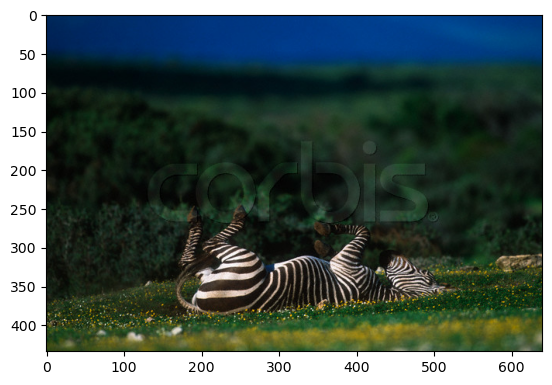

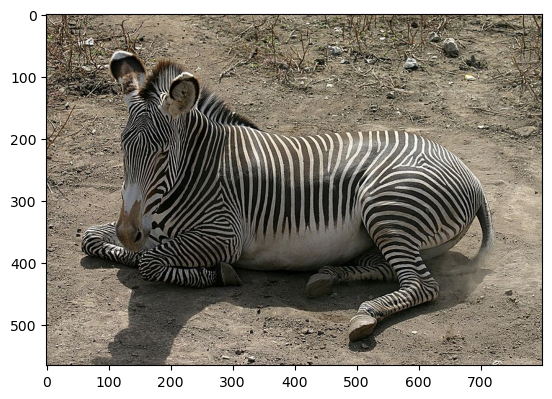

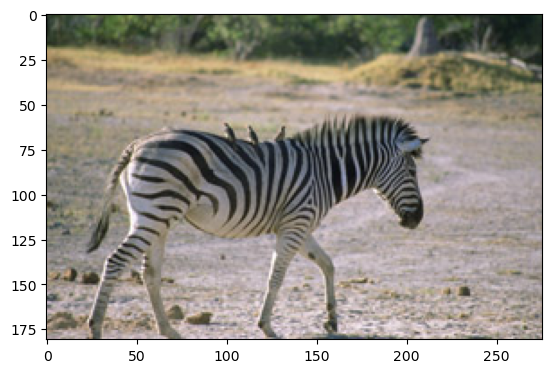

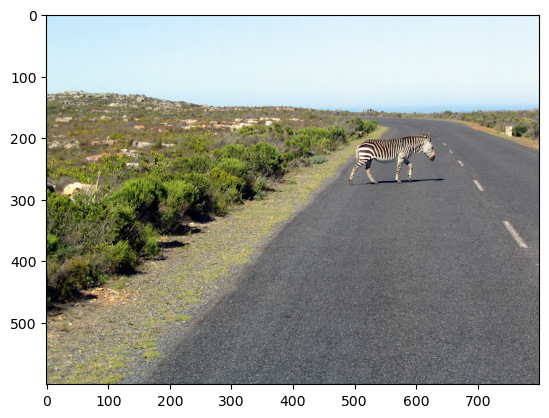

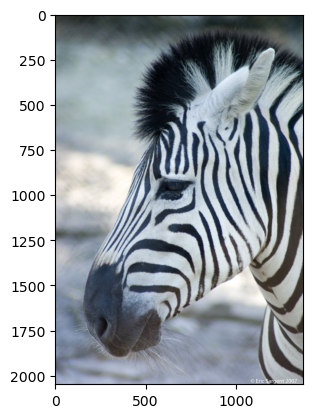

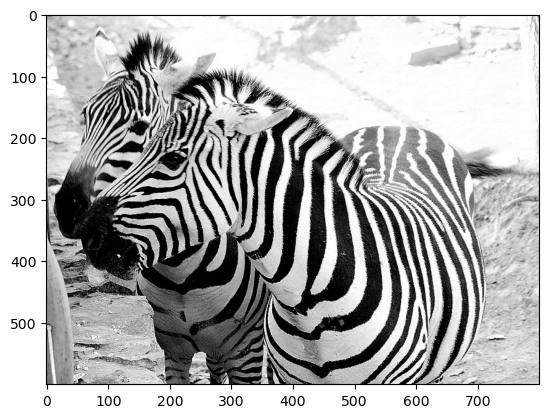

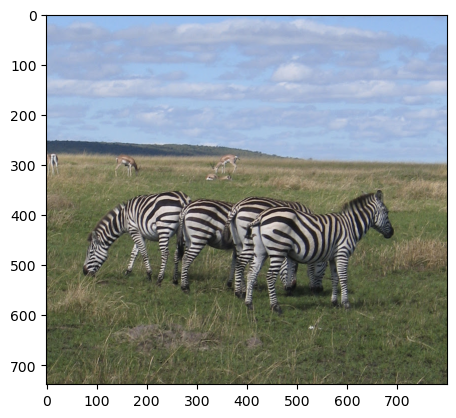

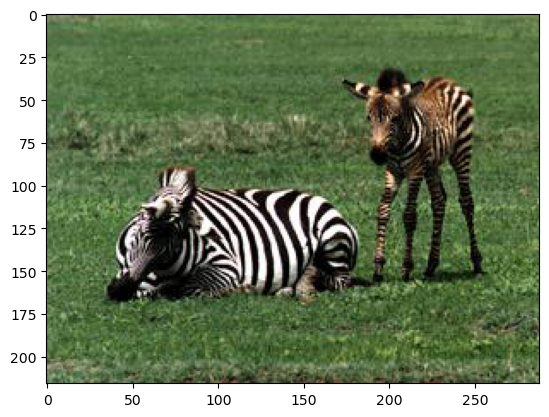

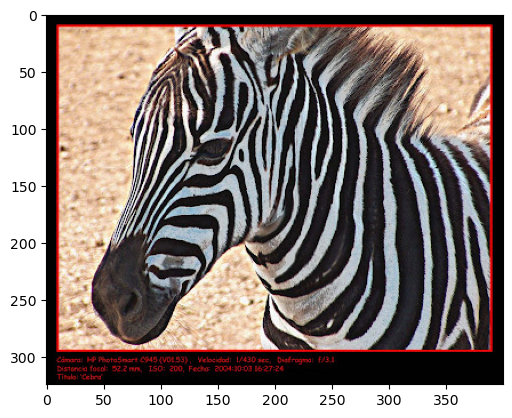

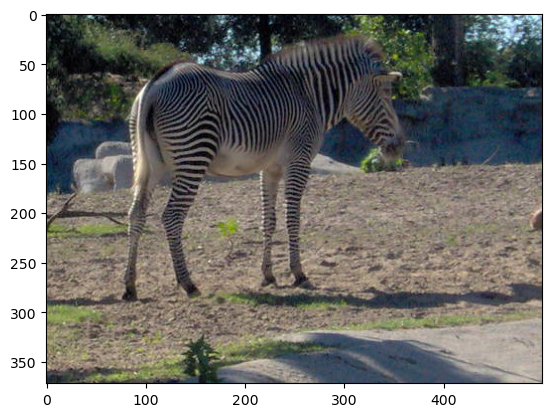

In [381]:
for i in range(len(zebra_imgs)):
    transformed_img = transform(zebra_imgs[i])

    input = transform_normalize(transformed_img)
    input = input.unsqueeze(0) # 1,3,224,224

    plt.imshow(zebra_imgs[i])
    plt.show()


In [382]:
# Load sample images from folder
zebra_tensors = torch.stack([transform(img) for img in zebra_imgs])
experimental_set_rand

[[Concept(0, 'striped'), Concept(3, 'random500_0')],
 [Concept(0, 'striped'), Concept(4, 'random500_1')]]

In [383]:
zebra_tensors.size()

torch.Size([10, 3, 224, 224])

In [384]:
# zebra class index
zebra_ind = 340

tcav_scores_w_random = mytcav.interpret(inputs=zebra_tensors,
                                        experimental_sets=experimental_set_rand,
                                        target=zebra_ind,
                                        n_steps=5,
                                       )


In [385]:
def format_float(f):
    return float('{:.3f}'.format(f) if abs(f) >= 0.0005 else '{:.3e}'.format(f))

def plot_tcav_scores(experimental_sets, tcav_scores):
    fig, ax = plt.subplots(1, len(experimental_sets), figsize = (25, 7))

    barWidth = 1 / (len(experimental_sets[0]) + 1)

    for idx_es, concepts in enumerate(experimental_sets):

        concepts = experimental_sets[idx_es]
        concepts_key = concepts_to_str(concepts)

        pos = [np.arange(len(layers))]
        for i in range(1, len(concepts)):
            pos.append([(x + barWidth) for x in pos[i-1]])
        _ax = (ax[idx_es] if len(experimental_sets) > 1 else ax)
        for i in range(len(concepts)):
            val = [format_float(scores['sign_count'][i]) for layer, scores in tcav_scores[concepts_key].items()]
            _ax.bar(pos[i], val, width=barWidth, edgecolor='white', label=concepts[i].name)

        # Add xticks on the middle of the group bars
        _ax.set_xlabel('Set {}'.format(str(idx_es)), fontweight='bold', fontsize=16)
        _ax.set_xticks([r + 0.3 * barWidth for r in range(len(layers))])
        _ax.set_xticklabels(layers, fontsize=16)

        # Create legend & Show graphic
        _ax.legend(fontsize=16)

    plt.show()

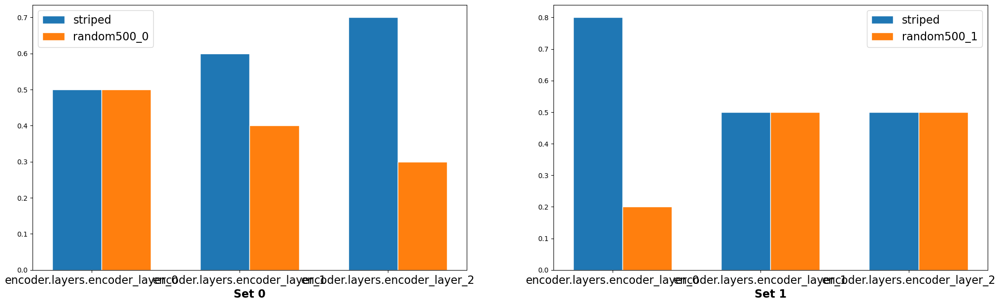

In [386]:
plot_tcav_scores(experimental_set_rand, tcav_scores_w_random)

In [387]:
experimental_set_zig_dot = [[stripes_concept, zigzagged_concept, dotted_concept]]

In [388]:
tcav_scores_w_zig_dot = mytcav.interpret(inputs=zebra_tensors,
                                         experimental_sets=experimental_set_zig_dot,
                                         target=zebra_ind,
                                         n_steps=5)

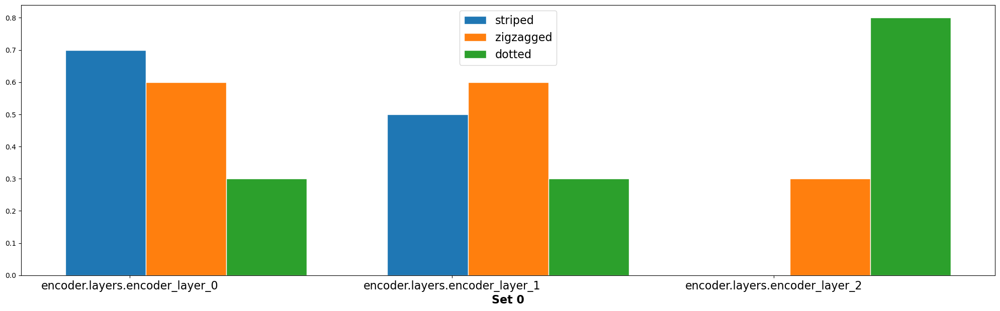

In [389]:
plot_tcav_scores(experimental_set_zig_dot, tcav_scores_w_zig_dot)   

In [390]:
n = 9

random_concepts = [assemble_concept('random' +str('500_')+ str(i+2), i+5) for i in range(0, n)]

print(random_concepts)

experimental_sets = [[stripes_concept, random_0_concept], [stripes_concept, random_1_concept]]
experimental_sets.extend([[stripes_concept, random_concept] for random_concept in random_concepts])

experimental_sets.append([random_0_concept, random_1_concept])
experimental_sets.extend([[random_0_concept, random_concept] for random_concept in random_concepts])

experimental_sets

[Concept(5, 'random500_2'), Concept(6, 'random500_3'), Concept(7, 'random500_4'), Concept(8, 'random500_5'), Concept(9, 'random500_6'), Concept(10, 'random500_7'), Concept(11, 'random500_8'), Concept(12, 'random500_9'), Concept(13, 'random500_10')]


[[Concept(0, 'striped'), Concept(3, 'random500_0')],
 [Concept(0, 'striped'), Concept(4, 'random500_1')],
 [Concept(0, 'striped'), Concept(5, 'random500_2')],
 [Concept(0, 'striped'), Concept(6, 'random500_3')],
 [Concept(0, 'striped'), Concept(7, 'random500_4')],
 [Concept(0, 'striped'), Concept(8, 'random500_5')],
 [Concept(0, 'striped'), Concept(9, 'random500_6')],
 [Concept(0, 'striped'), Concept(10, 'random500_7')],
 [Concept(0, 'striped'), Concept(11, 'random500_8')],
 [Concept(0, 'striped'), Concept(12, 'random500_9')],
 [Concept(0, 'striped'), Concept(13, 'random500_10')],
 [Concept(3, 'random500_0'), Concept(4, 'random500_1')],
 [Concept(3, 'random500_0'), Concept(5, 'random500_2')],
 [Concept(3, 'random500_0'), Concept(6, 'random500_3')],
 [Concept(3, 'random500_0'), Concept(7, 'random500_4')],
 [Concept(3, 'random500_0'), Concept(8, 'random500_5')],
 [Concept(3, 'random500_0'), Concept(9, 'random500_6')],
 [Concept(3, 'random500_0'), Concept(10, 'random500_7')],
 [Concept(3,

In [391]:
def assemble_scores(scores, experimental_sets, idx, score_layer, score_type):
    score_list = []
    for concepts in experimental_sets:
        score_list.append(scores["-".join([str(c.id) for c in concepts])][score_layer][score_type][idx])
        
    return score_list

In [392]:
def get_pval(scores, experimental_sets, score_layer, score_type, alpha=0.05, print_ret=False):
    
    P1 = assemble_scores(scores, experimental_sets, 0, score_layer, score_type)
    P2 = assemble_scores(scores, experimental_sets, 1, score_layer, score_type)
    print(P1),print(P2)
    if print_ret:
        print('P1[mean, std]: ', format_float(np.mean(P1)), format_float(np.std(P1)))
        print('P2[mean, std]: ', format_float(np.mean(P2)), format_float(np.std(P2)))

    _, pval = ttest_ind(P1, P2)

    if print_ret:
        print("p-values:", format_float(pval))

    if pval < alpha:    # alpha value is 0.05 or 5%
        relation = "Disjoint"
        if print_ret:
            print("Disjoint")
    else:
        relation = "Overlap"
        if print_ret:
            print("Overlap")
        
    return P1, P2, format_float(pval), relation

In [393]:
# Run TCAV
scores = mytcav.interpret(zebra_tensors, experimental_sets, zebra_ind, n_steps=5)

In [394]:
n = 4
def show_boxplots(layer, metric='sign_count'):

    def format_label_text(experimental_sets):
        concept_id_list = [exp.name if i == 0 else \
                             exp.name.split('_')[0] for i, exp in enumerate(experimental_sets[0])]
        return concept_id_list

    n_plots = 2

    fig, ax = plt.subplots(1, n_plots, figsize = (25, 7 * 1))
    fs = 18
    for i in range(n_plots):
        esl = experimental_sets[i * n : (i+1) * n]
        P1, P2, pval, relation = get_pval(scores, esl, layer, metric)
        print(P1,P2)
        ax[i].set_ylim([-0.5, 1.5])
        ax[i].set_title(layer + "-" + metric + " (pval=" + str(pval) + " - " + relation + ")", fontsize=fs)
        ax[i].boxplot([P1, P2], showfliers=True)

        ax[i].set_xticklabels(format_label_text(esl), fontsize=fs)

    plt.show()

[tensor(0.5000), tensor(0.8000), tensor(0.7000), tensor(0.3000)]
[tensor(0.5000), tensor(0.2000), tensor(0.3000), tensor(0.7000)]
[tensor(0.5000), tensor(0.8000), tensor(0.7000), tensor(0.3000)] [tensor(0.5000), tensor(0.2000), tensor(0.3000), tensor(0.7000)]
[tensor(0.5000), tensor(0.5000), tensor(0.8000), tensor(0.6000)]
[tensor(0.5000), tensor(0.5000), tensor(0.2000), tensor(0.4000)]
[tensor(0.5000), tensor(0.5000), tensor(0.8000), tensor(0.6000)] [tensor(0.5000), tensor(0.5000), tensor(0.2000), tensor(0.4000)]


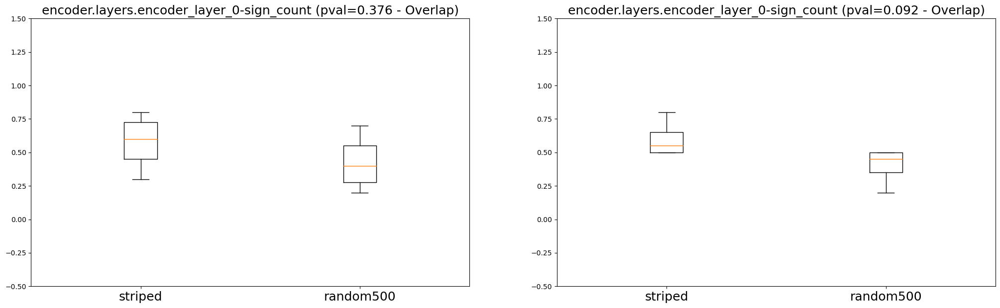

In [396]:
show_boxplots ('encoder.layers.encoder_layer_0')

[tensor(0.6000), tensor(0.5000), tensor(0.9000), tensor(0.3000)]
[tensor(0.4000), tensor(0.5000), tensor(0.1000), tensor(0.7000)]
[tensor(0.6000), tensor(0.5000), tensor(0.9000), tensor(0.3000)] [tensor(0.4000), tensor(0.5000), tensor(0.1000), tensor(0.7000)]
[tensor(0.6000), tensor(0.5000), tensor(0.6000), tensor(0.8000)]
[tensor(0.4000), tensor(0.5000), tensor(0.4000), tensor(0.2000)]
[tensor(0.6000), tensor(0.5000), tensor(0.6000), tensor(0.8000)] [tensor(0.4000), tensor(0.5000), tensor(0.4000), tensor(0.2000)]


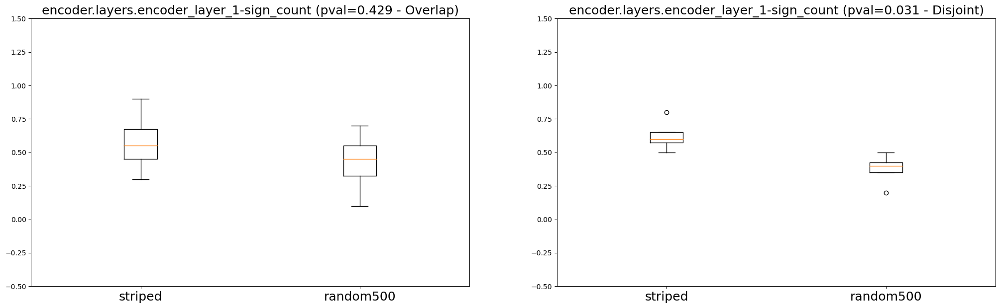

In [398]:
show_boxplots ('encoder.layers.encoder_layer_1')

[tensor(0.7000), tensor(0.5000), tensor(0.6000), tensor(0.6000)]
[tensor(0.3000), tensor(0.5000), tensor(0.4000), tensor(0.4000)]
[tensor(0.7000), tensor(0.5000), tensor(0.6000), tensor(0.6000)] [tensor(0.3000), tensor(0.5000), tensor(0.4000), tensor(0.4000)]
[tensor(0.3000), tensor(0.6000), tensor(0.3000), tensor(0.7000)]
[tensor(0.7000), tensor(0.4000), tensor(0.7000), tensor(0.3000)]
[tensor(0.3000), tensor(0.6000), tensor(0.3000), tensor(0.7000)] [tensor(0.7000), tensor(0.4000), tensor(0.7000), tensor(0.3000)]


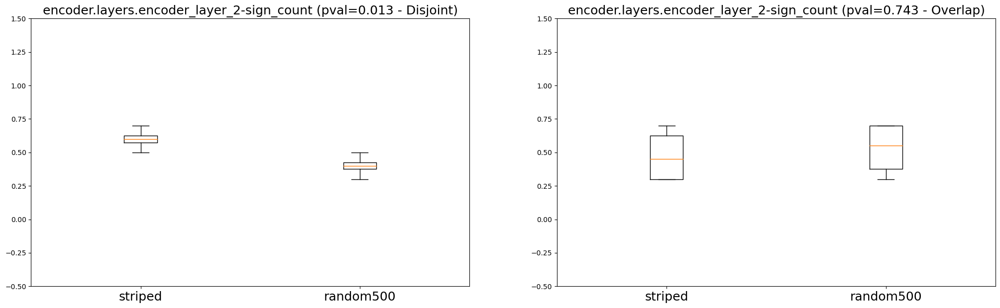

In [397]:
show_boxplots ('encoder.layers.encoder_layer_2')

---

## Ad_patch ResNet50

In [61]:
os.chdir('/home/js/Desktop/xai-main/')

In [62]:
model = torchvision.models.resnet50(pretrained=True)
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [63]:
layers=['layer2', 'layer3', 'layer4']

mytcav = TCAV(model=model,
              layers=layers,
              layer_attr_method = LayerIntegratedGradients(
                model, None, multiply_by_inputs=False))

In [64]:
experimental_set_rand = [[stripes_concept, random_0_concept], [stripes_concept, random_1_concept]]

In [104]:
# Load sample images from folder
zebra_imgs = load_image_tensors(set_getcwd+'/tcav/tcav/tcav_examples/image_models/imagenet/data/zebra', transform=False)

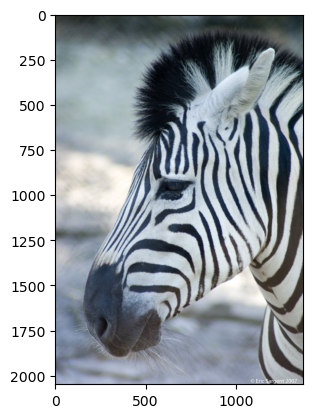

In [105]:
plt.imshow(zebra_imgs[4])

In [100]:
height, width, channels = img2.shape
print(height,width,channels)

308 309 3


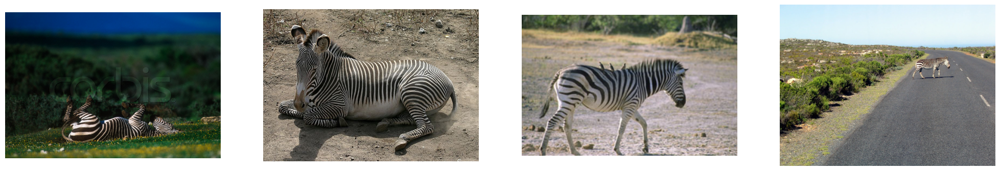

In [106]:
fig, axs = plt.subplots(1, 4, figsize = (25, 5))
axs[0].imshow(zebra_imgs[0])
axs[1].imshow(zebra_imgs[1])
axs[2].imshow(zebra_imgs[2])
axs[3].imshow(zebra_imgs[3])
# axs[4].imshow(zebra_imgs[4]])

axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
axs[3].axis('off')
# axs[4].axis('off')

plt.show()

In [107]:
# Load sample images from folder
zebra_tensors = torch.stack([transform(img) for img in zebra_imgs])
experimental_set_rand

[[Concept(0, 'striped'), Concept(3, 'random500_0')],
 [Concept(0, 'striped'), Concept(4, 'random500_1')]]

In [114]:
# 이미지의 높이, 너비, 채널 수 구하기
height, width, channels = img2.shape
# 배경 이미지의 ROI(Region of Interest : 관심영역) 구하기
roi = img1[0:height, 0:width]

dst = np.where(img2>10, img2, roi)
# 배경 이미지의 ROI 영역을 위의 dst 이미지로 변경
img1[0:height, 0:width] = dst

plt.imshow(img1)

10

In [144]:
zebra_tensors[0].shape

torch.Size([3, 224, 224])

In [130]:
img2=np.transpose(img2,(2,0,1))

In [149]:
# use numpy to convert the pil_image into a numpy array
img2 = cv2.imread('adversarial patch (toaster).png', cv2.IMREAD_COLOR)
img2=np.transpose(img2,(2,0,1))
channel, height, width = img2.shape

In [151]:
for i in range(len(zebra_tensors)):   
    # convert to a openCV2 image and convert from RGB to BGR format
    roi = zebra_tensors[i][:,0:height, 0:width]
    dst = np.where(img2>10, img2, roi)
    # 배경 이미지의 ROI 영역을 위의 dst 이미지로 변경
    zebra_tensors[i][:,0:height, 0:width] = dst

ValueError: operands could not be broadcast together with shapes (3,308,309) (3,308,309) (3,224,224) 

In [66]:
# zebra class index
zebra_ind = 340


tcav_scores_w_random = mytcav.interpret(inputs=zebra_tensors,
                                        experimental_sets=experimental_set_rand,
                                        target=zebra_ind,
                                        n_steps=5,
                                       )
tcav_scores_w_random

/home/js/anaconda3/lib/python3.9/site-packages/captum/_utils/models/linear_model/train.py:351: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:210.)
  bias_values = torch.FloatTensor([sklearn_model.intercept_]).to(  # type: ignore
/home/js/anaconda3/lib/python3.9/site-packages/torch/autograd/__init__.py:275: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 803: system has unsupported display driver / cuda driver combination (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


defaultdict(<function captum.concept._core.tcav.TCAV.interpret.<locals>.<lambda>()>,
            {'0-3': defaultdict(None,
                         {'layer2': {'sign_count': tensor([0.5000, 0.5000]),
                           'magnitude': tensor([-0.1823,  0.1823])},
                          'layer3': {'sign_count': tensor([0.4000, 0.6000]),
                           'magnitude': tensor([-0.1702,  0.1702])},
                          'layer4': {'sign_count': tensor([1., 0.]),
                           'magnitude': tensor([ 3.4402, -3.4402])}}),
             '0-4': defaultdict(None,
                         {'layer2': {'sign_count': tensor([0.5000, 0.5000]),
                           'magnitude': tensor([-0.1282,  0.1282])},
                          'layer3': {'sign_count': tensor([0.3000, 0.7000]),
                           'magnitude': tensor([-0.3240,  0.3240])},
                          'layer4': {'sign_count': tensor([0., 1.]),
                           'magnitude': tensor

In [67]:
def format_float(f):
    return float('{:.3f}'.format(f) if abs(f) >= 0.0005 else '{:.3e}'.format(f))

def plot_tcav_scores(experimental_sets, tcav_scores):
    fig, ax = plt.subplots(1, len(experimental_sets), figsize = (25, 7))

    barWidth = 1 / (len(experimental_sets[0]) + 1)

    for idx_es, concepts in enumerate(experimental_sets):

        concepts = experimental_sets[idx_es]
        concepts_key = concepts_to_str(concepts)

        pos = [np.arange(len(layers))]
        for i in range(1, len(concepts)):
            pos.append([(x + barWidth) for x in pos[i-1]])
        _ax = (ax[idx_es] if len(experimental_sets) > 1 else ax)
        for i in range(len(concepts)):
            val = [format_float(scores['sign_count'][i]) for layer, scores in tcav_scores[concepts_key].items()]
            _ax.bar(pos[i], val, width=barWidth, edgecolor='white', label=concepts[i].name)

        # Add xticks on the middle of the group bars
        _ax.set_xlabel('Set {}'.format(str(idx_es)), fontweight='bold', fontsize=16)
        _ax.set_xticks([r + 0.3 * barWidth for r in range(len(layers))])
        _ax.set_xticklabels(layers, fontsize=16)

        # Create legend & Show graphic
        _ax.legend(fontsize=16)

    plt.show()

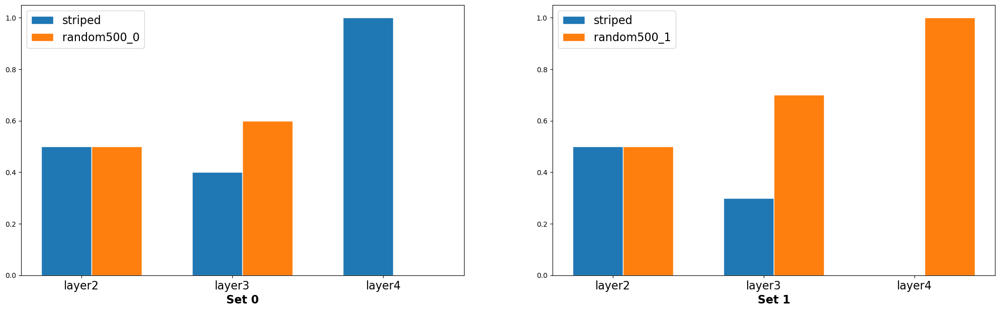

In [68]:
plot_tcav_scores(experimental_set_rand, tcav_scores_w_random)

In [69]:
experimental_set_zig_dot = [[stripes_concept, zigzagged_concept, dotted_concept]]

In [70]:
tcav_scores_w_zig_dot = mytcav.interpret(inputs=zebra_tensors,
                                         experimental_sets=experimental_set_zig_dot,
                                         target=zebra_ind,
                                         n_steps=5)

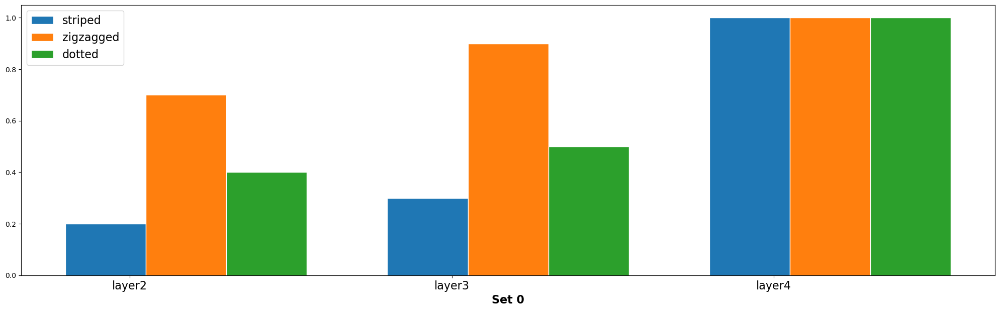

In [71]:
plot_tcav_scores(experimental_set_zig_dot, tcav_scores_w_zig_dot)   

In [72]:
n = 9

random_concepts = [assemble_concept('random' +str('500_')+ str(i+2), i+5) for i in range(0, n)]

print(random_concepts)

experimental_sets = [[stripes_concept, random_0_concept], [stripes_concept, random_1_concept]]
experimental_sets.extend([[stripes_concept, random_concept] for random_concept in random_concepts])

experimental_sets.append([random_0_concept, random_1_concept])
experimental_sets.extend([[random_0_concept, random_concept] for random_concept in random_concepts])

experimental_sets

[Concept(5, 'random500_2'), Concept(6, 'random500_3'), Concept(7, 'random500_4'), Concept(8, 'random500_5'), Concept(9, 'random500_6'), Concept(10, 'random500_7'), Concept(11, 'random500_8'), Concept(12, 'random500_9'), Concept(13, 'random500_10')]


[[Concept(0, 'striped'), Concept(3, 'random500_0')],
 [Concept(0, 'striped'), Concept(4, 'random500_1')],
 [Concept(0, 'striped'), Concept(5, 'random500_2')],
 [Concept(0, 'striped'), Concept(6, 'random500_3')],
 [Concept(0, 'striped'), Concept(7, 'random500_4')],
 [Concept(0, 'striped'), Concept(8, 'random500_5')],
 [Concept(0, 'striped'), Concept(9, 'random500_6')],
 [Concept(0, 'striped'), Concept(10, 'random500_7')],
 [Concept(0, 'striped'), Concept(11, 'random500_8')],
 [Concept(0, 'striped'), Concept(12, 'random500_9')],
 [Concept(0, 'striped'), Concept(13, 'random500_10')],
 [Concept(3, 'random500_0'), Concept(4, 'random500_1')],
 [Concept(3, 'random500_0'), Concept(5, 'random500_2')],
 [Concept(3, 'random500_0'), Concept(6, 'random500_3')],
 [Concept(3, 'random500_0'), Concept(7, 'random500_4')],
 [Concept(3, 'random500_0'), Concept(8, 'random500_5')],
 [Concept(3, 'random500_0'), Concept(9, 'random500_6')],
 [Concept(3, 'random500_0'), Concept(10, 'random500_7')],
 [Concept(3,

In [73]:
def assemble_scores(scores, experimental_sets, idx, score_layer, score_type):
    score_list = []
    for concepts in experimental_sets:
        score_list.append(scores["-".join([str(c.id) for c in concepts])][score_layer][score_type][idx])
        
    return score_list

In [74]:
def get_pval(scores, experimental_sets, score_layer, score_type, alpha=0.05, print_ret=False):
    
    P1 = assemble_scores(scores, experimental_sets, 0, score_layer, score_type)
    P2 = assemble_scores(scores, experimental_sets, 1, score_layer, score_type)
    print(P1),print(P2)
    if print_ret:
        print('P1[mean, std]: ', format_float(np.mean(P1)), format_float(np.std(P1)))
        print('P2[mean, std]: ', format_float(np.mean(P2)), format_float(np.std(P2)))

    _, pval = ttest_ind(P1, P2)

    if print_ret:
        print("p-values:", format_float(pval))

    if pval < alpha:    # alpha value is 0.05 or 5%
        relation = "Disjoint"
        if print_ret:
            print("Disjoint")
    else:
        relation = "Overlap"
        if print_ret:
            print("Overlap")
        
    return P1, P2, format_float(pval), relation

In [75]:
# Run TCAV
scores = mytcav.interpret(zebra_tensors, experimental_sets, zebra_ind, n_steps=5)

In [76]:
n = 4
def show_boxplots(layer, metric='sign_count'):

    def format_label_text(experimental_sets):
        concept_id_list = [exp.name if i == 0 else \
                             exp.name.split('_')[0] for i, exp in enumerate(experimental_sets[0])]
        return concept_id_list

    n_plots = 2

    fig, ax = plt.subplots(1, n_plots, figsize = (25, 7 * 1))
    fs = 18
    for i in range(n_plots):
        esl = experimental_sets[i * n : (i+1) * n]
        P1, P2, pval, relation = get_pval(scores, esl, layer, metric)
        print(P1,P2)
        ax[i].set_ylim([-0.5, 1.5])
        ax[i].set_title(layer + "-" + metric + " (pval=" + str(pval) + " - " + relation + ")", fontsize=fs)
        ax[i].boxplot([P1, P2], showfliers=True)

        ax[i].set_xticklabels(format_label_text(esl), fontsize=fs)

    plt.show()

[tensor(0.5000), tensor(0.5000), tensor(0.6000), tensor(0.3000)]
[tensor(0.5000), tensor(0.5000), tensor(0.4000), tensor(0.7000)]
[tensor(0.5000), tensor(0.5000), tensor(0.6000), tensor(0.3000)] [tensor(0.5000), tensor(0.5000), tensor(0.4000), tensor(0.7000)]
[tensor(0.4000), tensor(0.2000), tensor(0.4000), tensor(0.1000)]
[tensor(0.6000), tensor(0.8000), tensor(0.6000), tensor(0.9000)]
[tensor(0.4000), tensor(0.2000), tensor(0.4000), tensor(0.1000)] [tensor(0.6000), tensor(0.8000), tensor(0.6000), tensor(0.9000)]


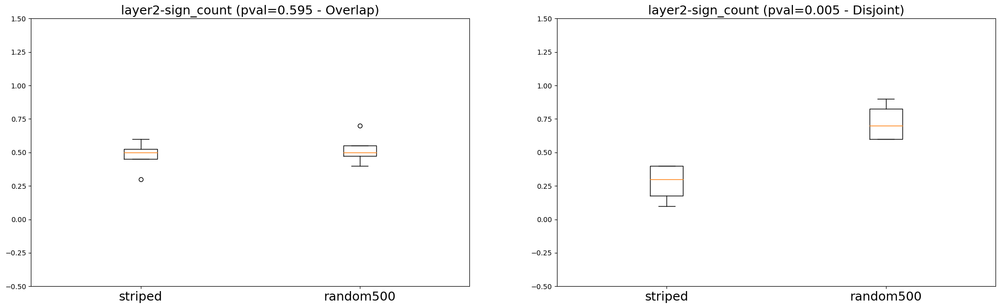

In [77]:
show_boxplots ("layer2")

[tensor(0.4000), tensor(0.3000), tensor(0.5000), tensor(0.5000)]
[tensor(0.6000), tensor(0.7000), tensor(0.5000), tensor(0.5000)]
[tensor(0.4000), tensor(0.3000), tensor(0.5000), tensor(0.5000)] [tensor(0.6000), tensor(0.7000), tensor(0.5000), tensor(0.5000)]
[tensor(0.6000), tensor(0.4000), tensor(0.6000), tensor(0.5000)]
[tensor(0.4000), tensor(0.6000), tensor(0.4000), tensor(0.5000)]
[tensor(0.6000), tensor(0.4000), tensor(0.6000), tensor(0.5000)] [tensor(0.4000), tensor(0.6000), tensor(0.4000), tensor(0.5000)]


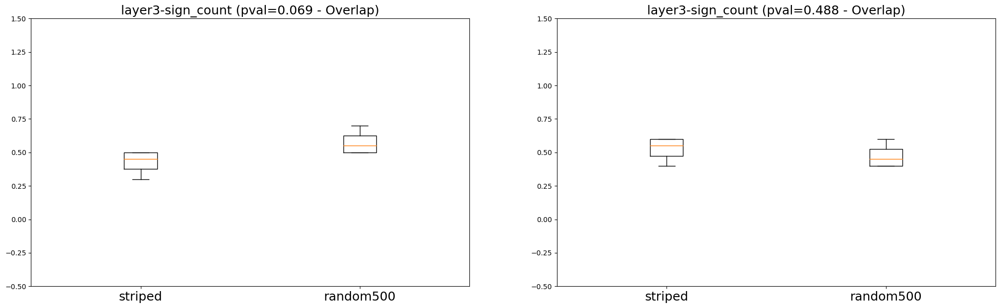

In [78]:
show_boxplots ("layer3")

[tensor(1.), tensor(0.), tensor(1.), tensor(1.)]
[tensor(0.), tensor(1.), tensor(0.), tensor(0.)]
[tensor(1.), tensor(0.), tensor(1.), tensor(1.)] [tensor(0.), tensor(1.), tensor(0.), tensor(0.)]
[tensor(0.), tensor(0.), tensor(1.), tensor(1.)]
[tensor(1.), tensor(1.), tensor(0.), tensor(0.)]
[tensor(0.), tensor(0.), tensor(1.), tensor(1.)] [tensor(1.), tensor(1.), tensor(0.), tensor(0.)]


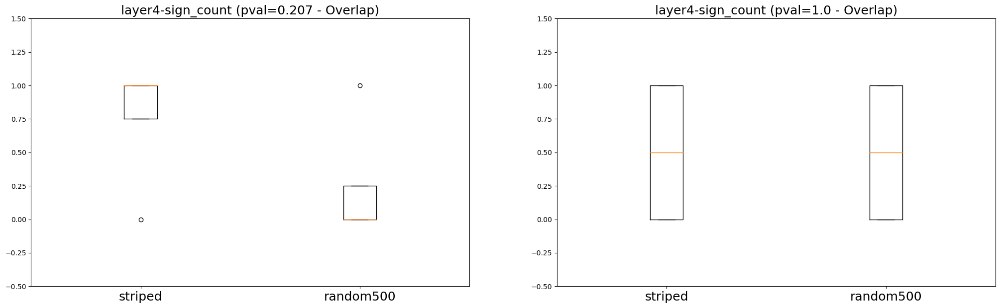

In [79]:
show_boxplots ("layer4")